# style transfer

I did this previously with tf but tyring with pytorch because why not...

style transfer takes a pretrained network, in this case the oxford vgg model and taking the style from one image nad using it on the input/content image.

both content and style images are fed into the model and they need to be the same shape.

load the model using pytorch pretrained model repo

use diff layers for diff functions to extract diff features with diff tasks

use three diff loss functions to optimize 
- content loss - difff btw content and output
- style loss - diff btw style and output
- total loss - combined style and content loss balanced with weights btw the two

update params w/gradients





In [2]:
#dependencies
import numpy as np
import torch
from torch import nn, optim
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms, models

if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

print(device)

cuda


In [4]:
#image loader vars
imsize = 224

loader = (transforms.Compose([
    transforms.Resize(imsize),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406),
                         (0.229, 0.224, 0.225))]))

In [9]:
#image loader funct
def image_loader(image_name):
    image = Image.open(image_name)
    display(image)
    image = loader(image).unsqueeze(0)
    return image

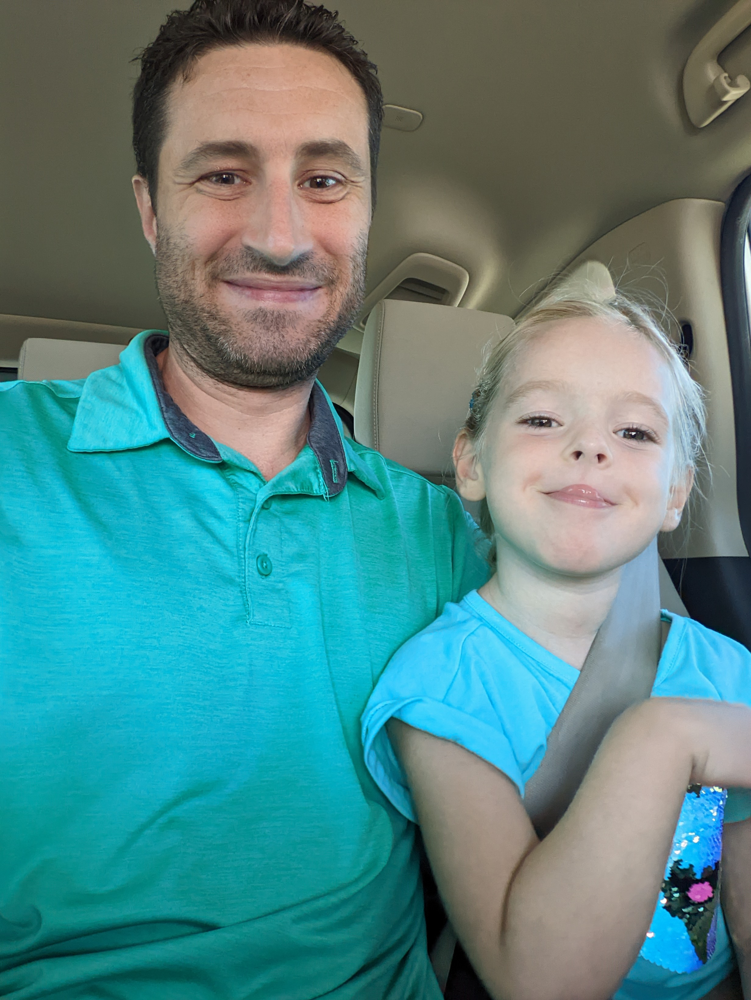

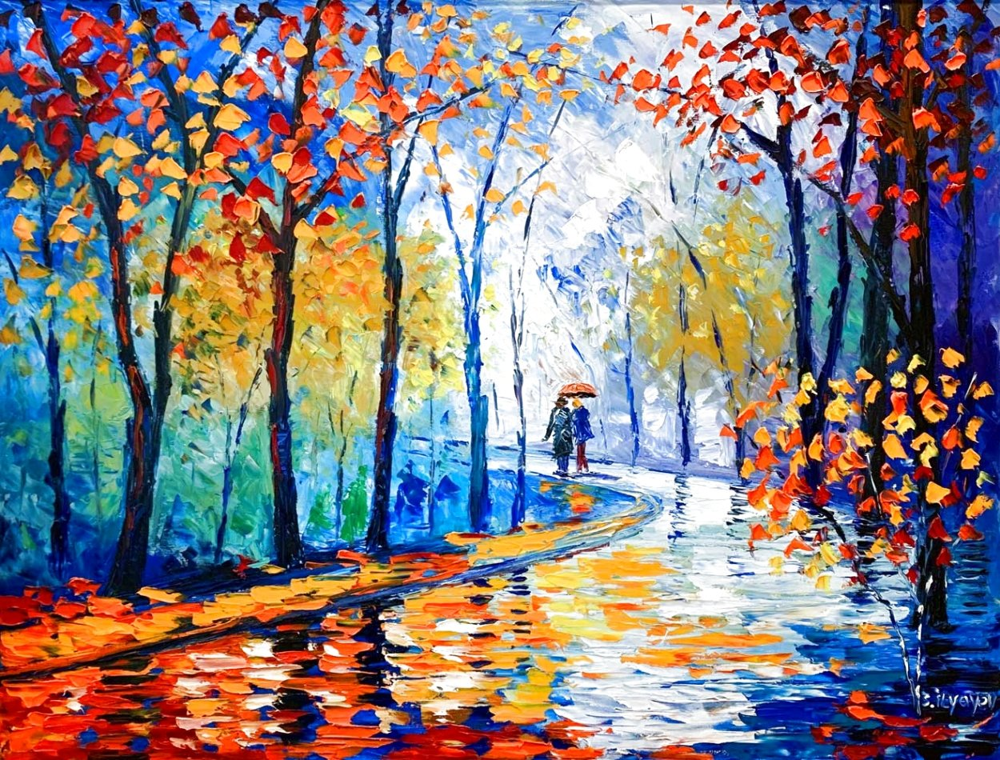

In [13]:
content_img = image_loader("ambra3.jpg").to(device)
style_img = image_loader("colorful impressionist.jpg").to(device)


In [14]:
#to revert to pil and display outputs
unloader = (transforms.Compose([
    transforms.Normalize((-0.485/0.229,
                          -0.456/0.224,
                          -0.406/0.225),
                         (1/0.229, 1/0.224, 1/0.225)),
    transforms.ToPILImage()]))

def tensor2image(tensor):
    image = tensor.to('cpu').clone()
    image = image.squeeze(0)
    image = unloader(image)
    return image

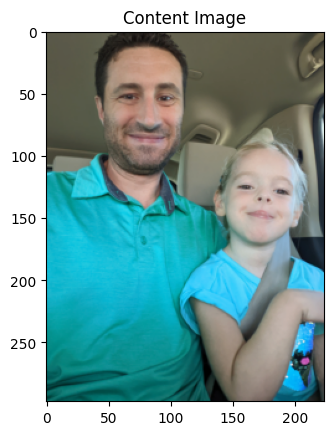

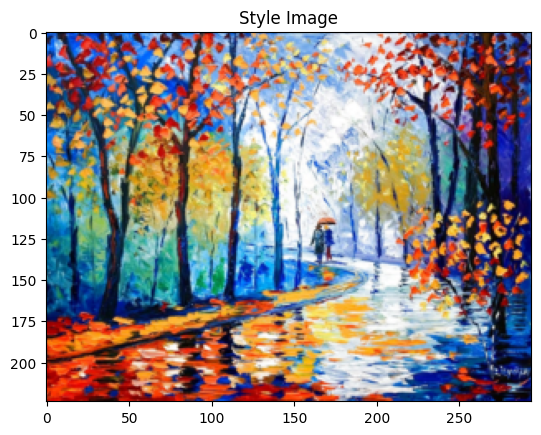

In [15]:
plt.figure()
plt.imshow(tensor2image(content_img))
plt.title("Content Image")
plt.show()
plt.figure()
plt.imshow(tensor2image(style_img))
plt.title("Style Image")
plt.show()

In [16]:
#load model
model = models.vgg19(pretrained=True).features

for param in model.parameters():
    param.requires_grad_(False)
    
model.to(device)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [17]:
#extract features from each layer
print(model)
       


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [18]:
relevant_layers = ({'0': 'conv1_1', '5': 'conv2_1', '10': 'conv3_1', 
                    '19': 'conv4_1', '21': 'conv4_2', '28': 'conv5_1'})

In [19]:
def features_extractor(x, model, layers):
    features = {}
    for index, layer in model._modules.items():
        x = layer(x)
        if index in layers:
            features[layers[index]] = x
            
    return features


In [20]:
#extract features from images
content_features = features_extractor(content_img, model, relevant_layers)
style_features = features_extractor(style_img, model, relevant_layers)

In [21]:
#perform matrix calcs over style features
style_grams = {}
for i in style_features:
    layer = style_features[i]
    _, d1, d2, d3 = layer.shape
    features = layer.view(d1, d2 * d3)
    gram = torch.mm(features, features.t())
    style_grams[i] = gram
    
    

In [23]:
#create init target image
target_img = content_img.clone().requires_grad_(True).to(device)

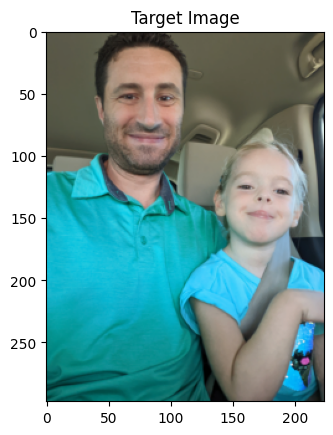

In [24]:
#show target image
plt.figure()
plt.imshow(tensor2image(target_img))
plt.title("Target Image")
plt.show()

In [25]:
#create style weights
style_weights = {'conv1_1': 1., 'conv2_1': 0.8, 'conv3_1': 0.6, 'conv4_1': 0.4, 'conv5_1': 0.2}

In [26]:
#define content and style weights
alpha = 1
beta = 1e5

In [27]:
#define run params
print_statement = 200
optimizer = torch.optim.Adam([target_img], lr=0.001)
iterations = 2000

Total loss:  272337760.0


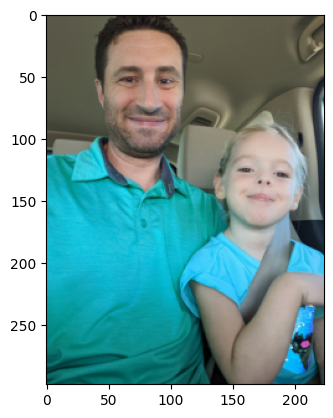

Total loss:  126415856.0


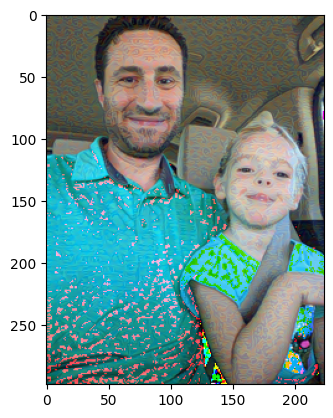

Total loss:  66487868.0


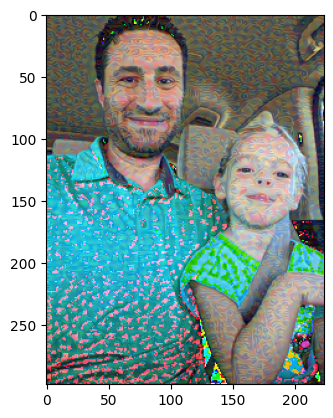

Total loss:  39883064.0


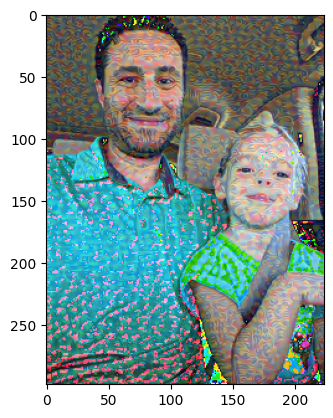

Total loss:  26171442.0


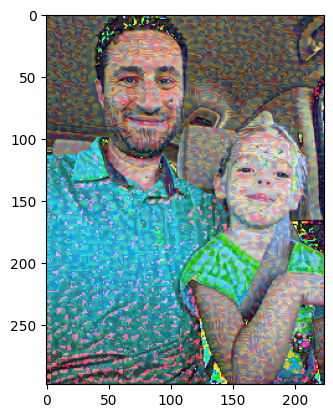

Total loss:  18237444.0


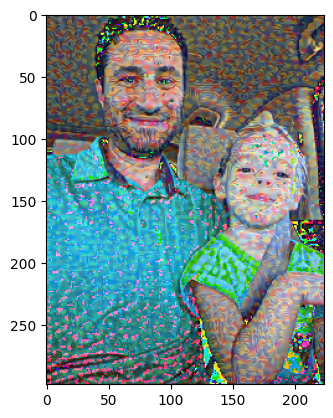

Total loss:  13197573.0


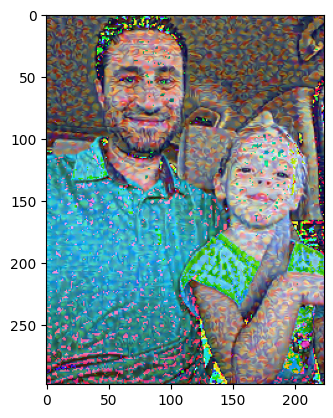

Total loss:  9813934.0


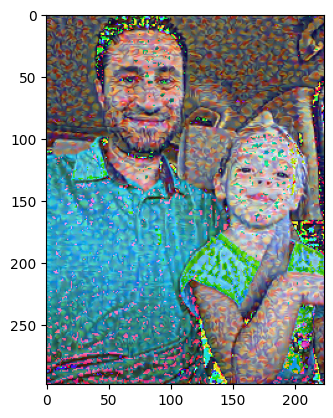

Total loss:  7448417.5


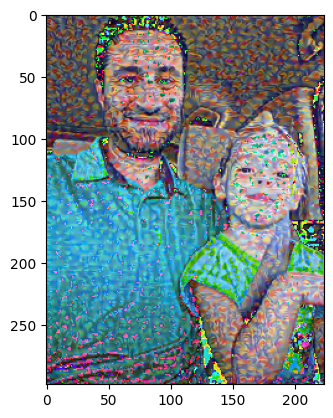

Total loss:  5764503.5


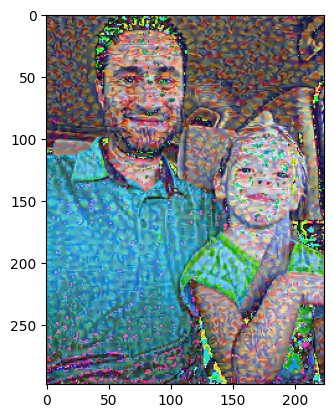

Total loss:  4545694.5


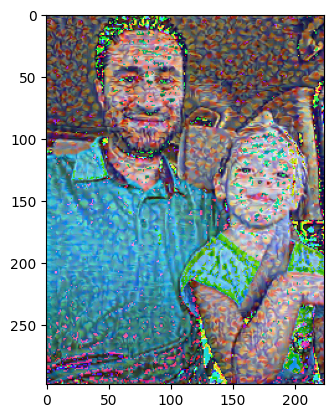

In [28]:
for i in range(1, iterations+1):
    # Extract features for all relevant layers
    target_features = features_extractor(target_img, model, relevant_layers)
    
    # Calculate the content loss
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    # Loop through all style layers
    style_losses = 0
    for layer in style_weights:
        
        # Create gram matrix for that layer
        target_feature = target_features[layer]
        _, d1, d2, d3 = target_feature.shape
        target_reshaped = target_feature.view(d1, d2 * d3)
        target_gram = torch.mm(target_reshaped, target_reshaped.t())
        style_gram = style_grams[layer]
        
        # Calculate style loss for that layer
        style_loss = style_weights[layer]  * torch.mean((target_gram - style_gram)**2)
        
        #Calculate style loss for all layers
        style_losses += style_loss / (d1 * d2 * d3)
    
    # Calculate the total loss
    total_loss = alpha * content_loss + beta * style_losses
    
    # Perform back propagation
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    # Print target image
    if i % print_statement == 0 or i == 1:
        print('Total loss: ', total_loss.item())
        plt.imshow(tensor2image(target_img))
        plt.show()

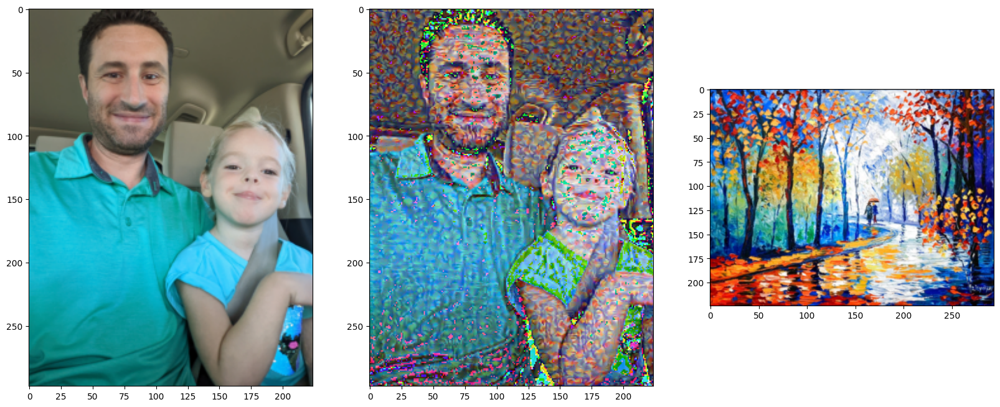

In [29]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(tensor2image(content_img))
ax2.imshow(tensor2image(target_img))
ax3.imshow(tensor2image(style_img))
plt.show()